In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install --upgrade kaggle

In [ ]:

!mkdir -p ~/.kaggle
!cp /content/drive/MyDrive/kaggle.json ~/.kaggle/kaggle.json


In [ ]:
!kaggle datasets download -d splcher/animefacedataset

 98% 387M/395M [00:01<00:00, 194MB/s]
100% 395M/395M [00:01<00:00, 221MB/s]


In [ ]:
!unzip /content/animefacedataset.zip -d /content/sample_data/images/

Streaming output truncated to the last 5000 lines.
  inflating: /content/sample_data/images/images/62764_2019.jpg  
  inflating: /content/sample_data/images/images/62765_2019.jpg  
  inflating: /content/sample_data/images/images/62766_2019.jpg  
  inflating: /content/sample_data/images/images/62767_2019.jpg  
  inflating: /content/sample_data/images/images/62768_2019.jpg  
  inflating: /content/sample_data/images/images/62769_2019.jpg  
  inflating: /content/sample_data/images/images/6276_2003.jpg  
  inflating: /content/sample_data/images/images/62770_2019.jpg  
  inflating: /content/sample_data/images/images/62771_2019.jpg  
  inflating: /content/sample_data/images/images/62772_2019.jpg  
  inflating: /content/sample_data/images/images/62773_2019.jpg  
  inflating: /content/sample_data/images/images/62774_2019.jpg  
  inflating: /content/sample_data/images/images/62775_2019.jpg  
  inflating: /content/sample_data/images/images/62776_2019.jpg  
  inflating: /content/sample_data/images

In [ ]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
import numpy as np
import torchvision.datasets as datasets
import torchvision
def show_tensor_images(image_tensor, num_images=64):

    plt.figure(figsize=(12,12))
    image_tensor = ((image_tensor + 1.0) / 2.0)
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=8)
    plt.imshow(image_grid.permute(1,2,0).squeeze())
    plt.show()

In [ ]:
class Discriminator(nn.Module):
  def __init__(self):
    super(Discriminator,self).__init__()
    self.Disc=nn.Sequential(nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
                            nn.BatchNorm2d(64),
                            nn.LeakyReLU(0.2, inplace=True),

                            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
                            nn.BatchNorm2d(128),
                            nn.LeakyReLU(0.2, inplace=True),

                            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
                            nn.BatchNorm2d(256),
                            nn.LeakyReLU(0.2, inplace=True),

                            nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
                            nn.BatchNorm2d(512),
                            nn.LeakyReLU(0.2, inplace=True),

                            nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),

                            nn.Flatten(),
                            nn.Sigmoid())
  def forward(self,x):
      return self.Disc(x)
      


In [ ]:
latent_dim=128
class Generator(nn.Module):
  def __init__(self,latent_dim=128):
    super(Generator,self).__init__()
    self.latent_dim=latent_dim

    self.Gen=nn.Sequential(nn.ConvTranspose2d(latent_dim,512,kernel_size=4,stride=1,padding=0),
                        nn.BatchNorm2d(512),
                        nn.ReLU(True),
                        nn.ConvTranspose2d(512,256,kernel_size=4,stride=2,padding=1),
                        nn.BatchNorm2d(256),
                        nn.ReLU(True),
                        nn.ConvTranspose2d(256,128,kernel_size=4,stride=2,padding=1),
                        nn.BatchNorm2d(128),
                        nn.ReLU(True),
                        nn.ConvTranspose2d(128,64,kernel_size=4,stride=2,padding=1),
                        nn.BatchNorm2d(64),
                        nn.ReLU(True),
                        nn.ConvTranspose2d(64,3,kernel_size=4,stride=2,padding=1),
                        nn.Tanh())
  def forward(self,x):
    return self.Gen(x)

In [ ]:
import torch.nn.functional as F
displaystep=100
batch_size=128
lr=0.00002
beta_1=0.3
beta_2=0.8
device='cuda'
train_dir='/content/sample_data/images'
from torchvision.transforms.transforms import RandomCrop
data_transforms=transforms.Compose([transforms.Resize((64,64)),
                                    transforms.RandomCrop(size=(64,64)),
                                   # transforms.ColorJitter(hue=.3,brightness=.5),
                                    transforms.ToTensor(),
                                    transforms.Normalize((0.425, 0.415, 0.405), (0.5, 0.5, 0.5)),
                                    ])



data_train=datasets.ImageFolder(root=train_dir,transform=data_transforms)

trainloader=DataLoader(data_train,batch_size=64,shuffle=True)


print(len(data_train))
data_train


63565


Dataset ImageFolder
    Number of datapoints: 63565
    Root location: /content/sample_data/images
    StandardTransform
Transform: Compose(
               Resize(size=(64, 64), interpolation=bilinear, max_size=None, antialias=None)
               RandomCrop(size=(64, 64), padding=None)
               ToTensor()
               Normalize(mean=(0.425, 0.415, 0.405), std=(0.5, 0.5, 0.5))
           )

In [ ]:
gen=Generator(latent_dim).to('cuda')
gen_opt=torch.optim.Adam(gen.parameters(),lr=lr,betas=(beta_1,beta_2))

In [ ]:
disc=Discriminator().to('cuda')
disc_opt=torch.optim.Adam(disc.parameters(),lr=lr,betas=(beta_1,beta_2))

  0%|          | 0/994 [00:00<?, ?it/s]

epochs 0: Generator loss: 75.81059375941764, discriminator loss: 0.15757683802934488


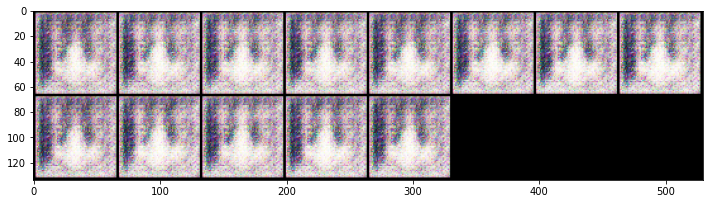

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


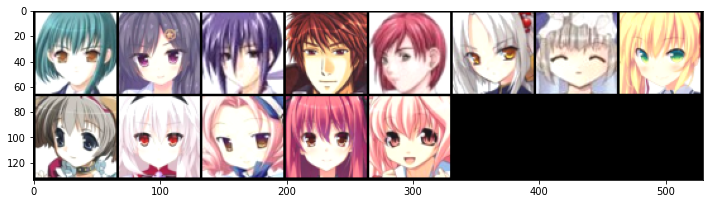

  0%|          | 0/994 [00:00<?, ?it/s]

epochs 1: Generator loss: 54.70213148117067, discriminator loss: 0.4500837018777376


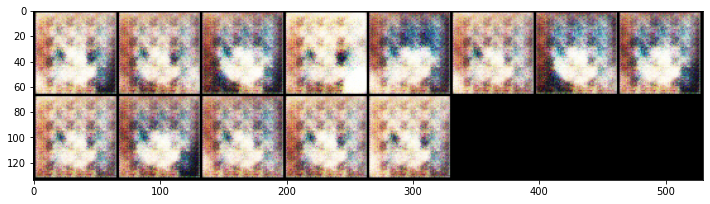

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


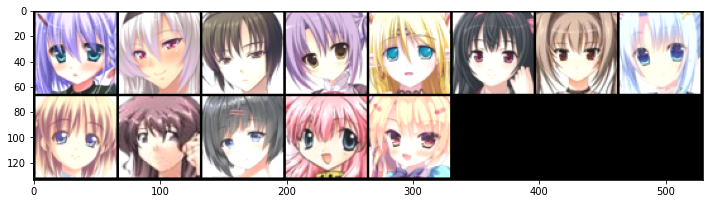

  0%|          | 0/994 [00:00<?, ?it/s]

epochs 2: Generator loss: 40.1879035437107, discriminator loss: 0.8908787445630876


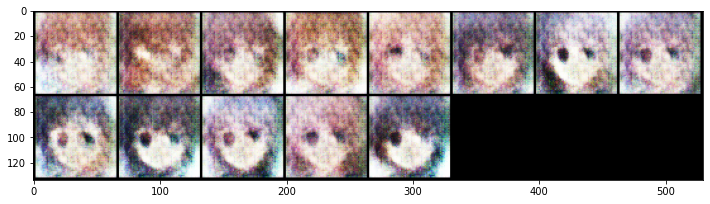

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


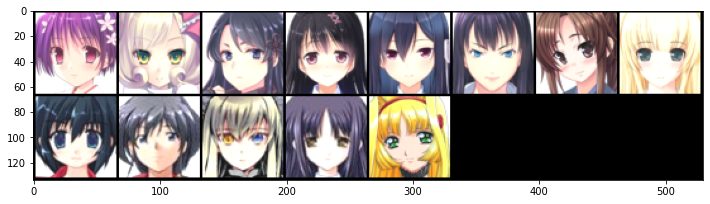

  0%|          | 0/994 [00:00<?, ?it/s]

epochs 3: Generator loss: 36.69193982720376, discriminator loss: 1.1365528364293271


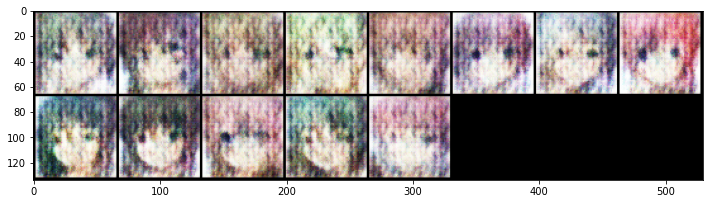

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


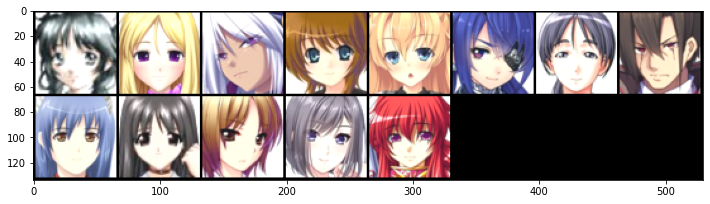

  0%|          | 0/994 [00:00<?, ?it/s]

epochs 4: Generator loss: 35.53900142073633, discriminator loss: 1.2289315801858904


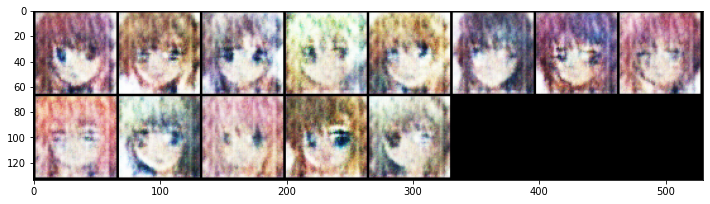

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


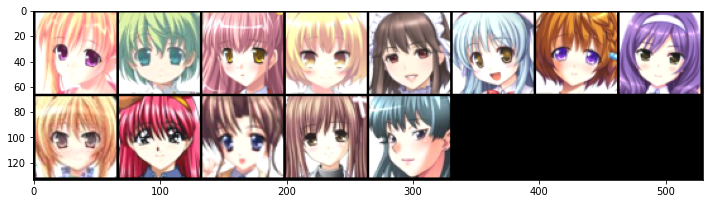

  0%|          | 0/994 [00:00<?, ?it/s]

epochs 5: Generator loss: 34.86533064842221, discriminator loss: 1.214309625476599


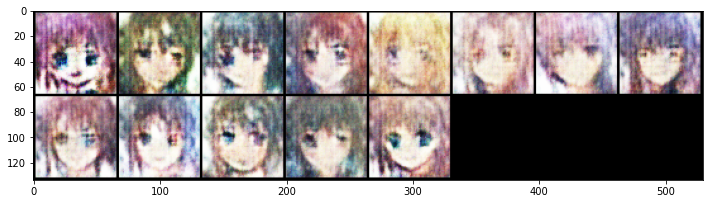

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


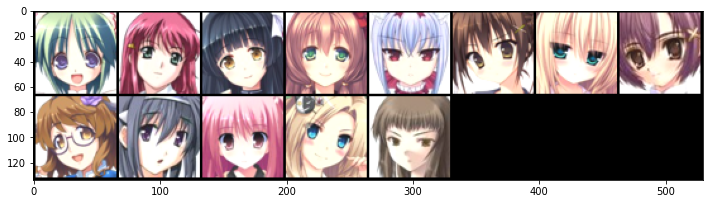

  0%|          | 0/994 [00:00<?, ?it/s]

epochs 6: Generator loss: 34.58579638898374, discriminator loss: 1.1725193585827938


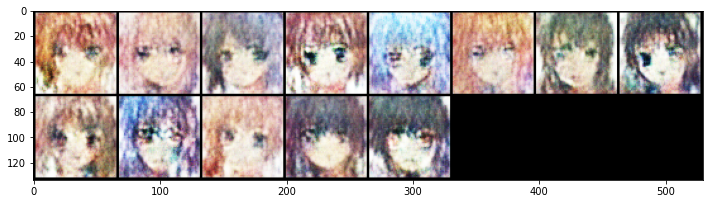

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


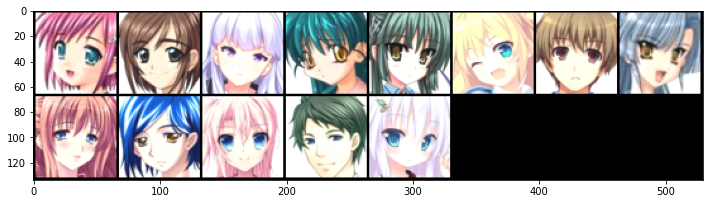

  0%|          | 0/994 [00:00<?, ?it/s]

epochs 7: Generator loss: 34.91788361966606, discriminator loss: 1.053710594922304


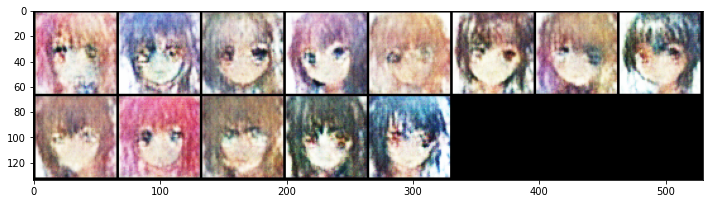

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


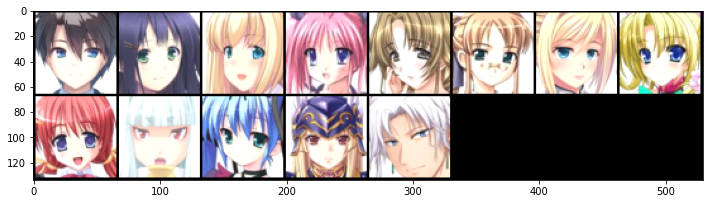

  0%|          | 0/994 [00:00<?, ?it/s]

epochs 8: Generator loss: 37.99212242722509, discriminator loss: 0.7913388466835027


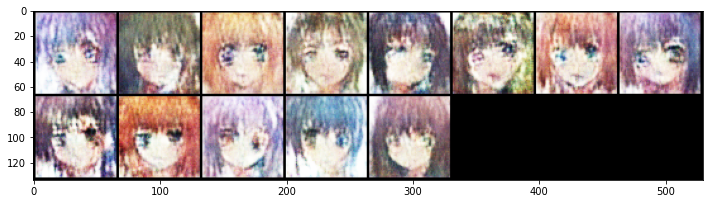

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


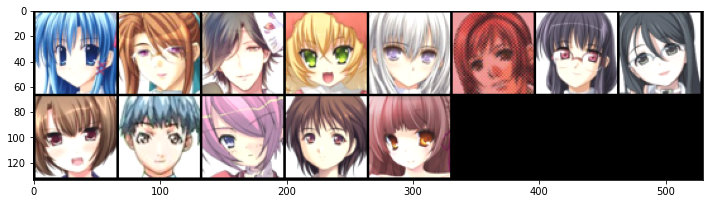

  0%|          | 0/994 [00:00<?, ?it/s]

epochs 9: Generator loss: 40.45578648447984, discriminator loss: 0.6903227620199326


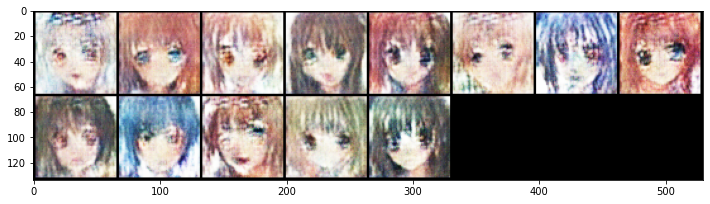

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


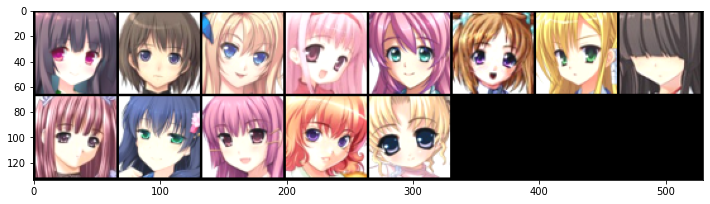

  0%|          | 0/994 [00:00<?, ?it/s]

epochs 10: Generator loss: 82.697061624527, discriminator loss: 0.2935484213317745


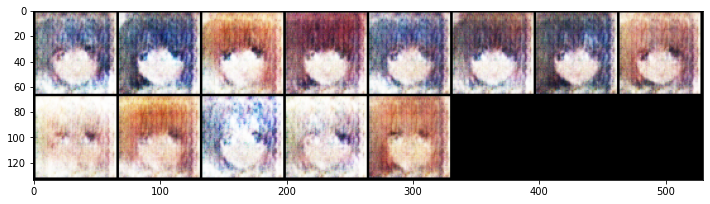

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


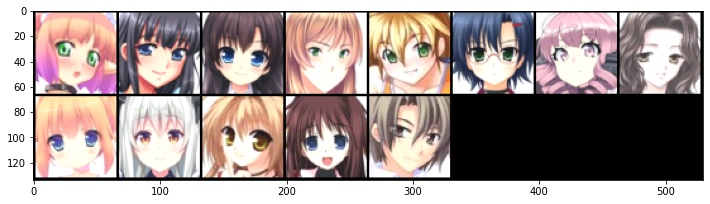

  0%|          | 0/994 [00:00<?, ?it/s]

epochs 11: Generator loss: 59.308024349212666, discriminator loss: 0.38657788719981906


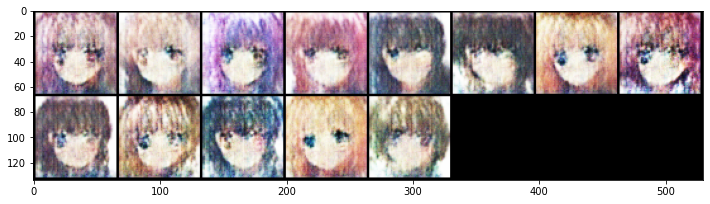

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


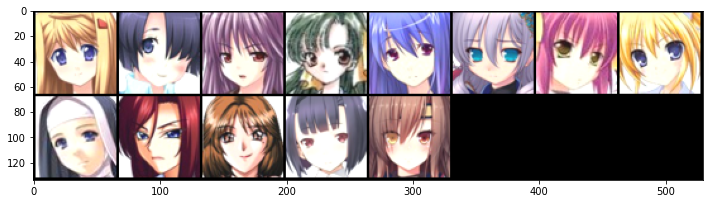

  0%|          | 0/994 [00:00<?, ?it/s]

epochs 12: Generator loss: 79.87106377840038, discriminator loss: 0.3971828677775315


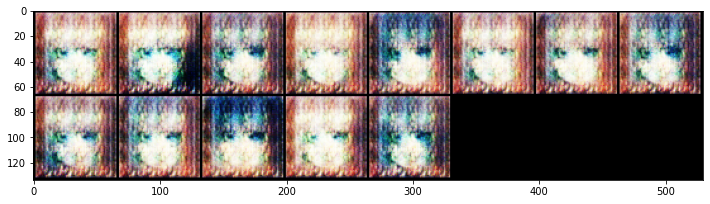

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


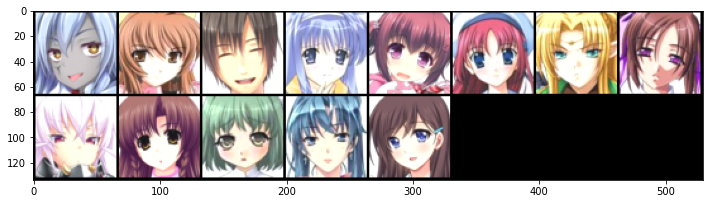

  0%|          | 0/994 [00:00<?, ?it/s]

epochs 13: Generator loss: 89.54759214162837, discriminator loss: 0.14639888119829347


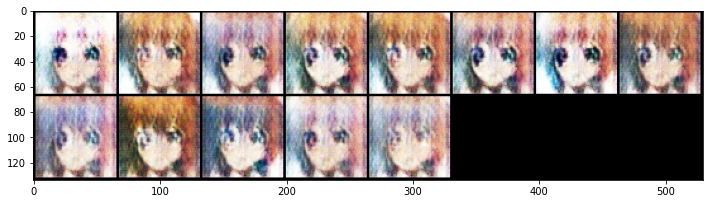

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


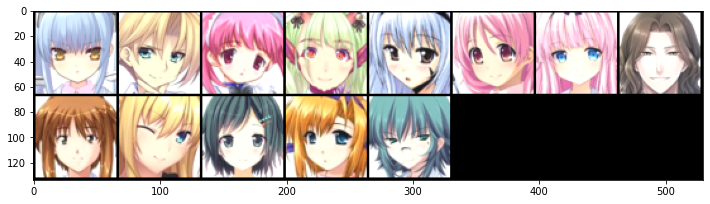

  0%|          | 0/994 [00:00<?, ?it/s]

epochs 14: Generator loss: 70.6768401539326, discriminator loss: 0.254580423196603


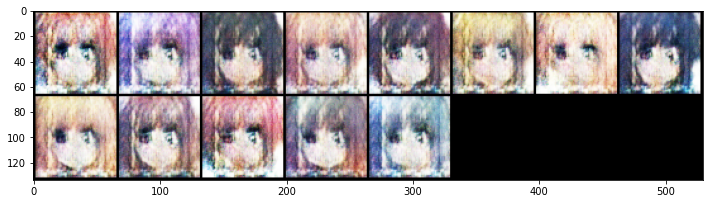

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


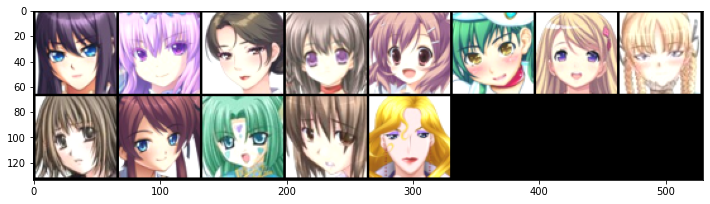

  0%|          | 0/994 [00:00<?, ?it/s]

epochs 15: Generator loss: 61.16705339193341, discriminator loss: 0.41188956330064636


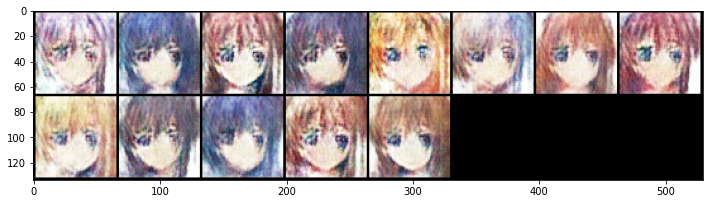

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


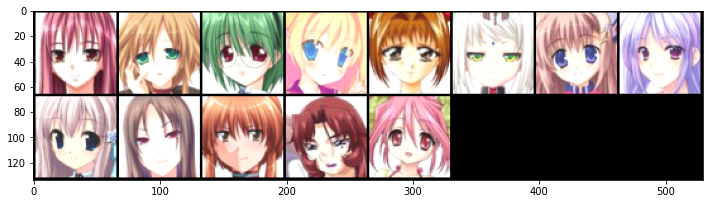

  0%|          | 0/994 [00:00<?, ?it/s]

epochs 16: Generator loss: 57.27627651095389, discriminator loss: 0.5498217293038034


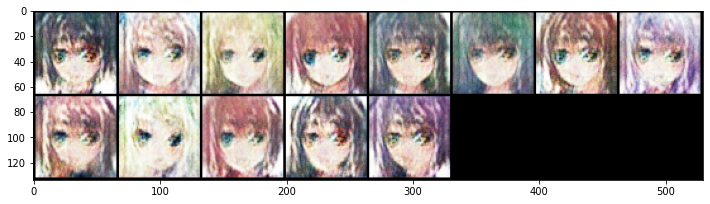

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


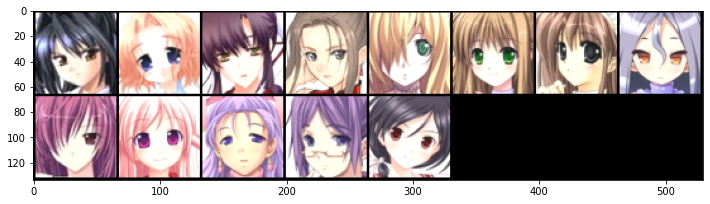

  0%|          | 0/994 [00:00<?, ?it/s]

epochs 17: Generator loss: 56.86552952051166, discriminator loss: 0.5158686095150189


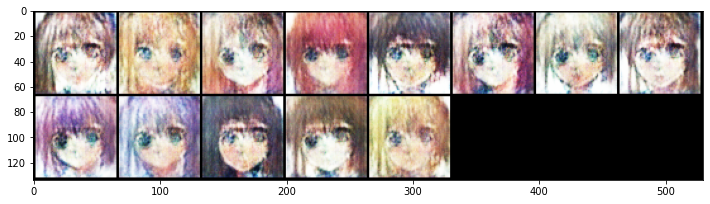

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


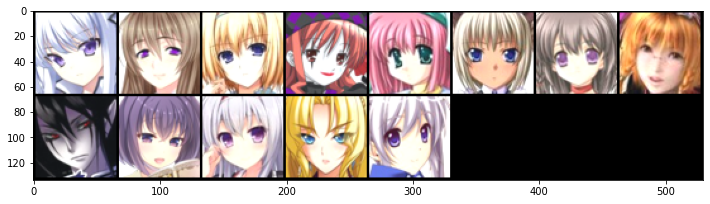

  0%|          | 0/994 [00:00<?, ?it/s]

epochs 18: Generator loss: 57.87052971363076, discriminator loss: 0.5898252481780958


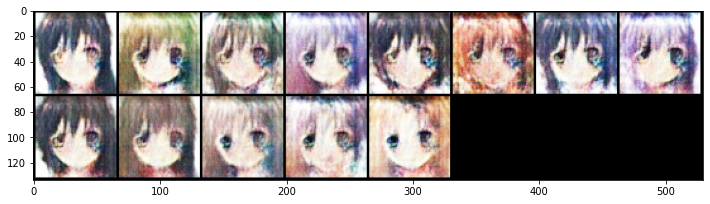

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


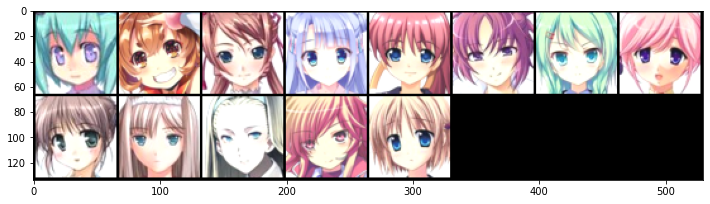

  0%|          | 0/994 [00:00<?, ?it/s]

epochs 19: Generator loss: 54.37157802343377, discriminator loss: 0.663328863377683


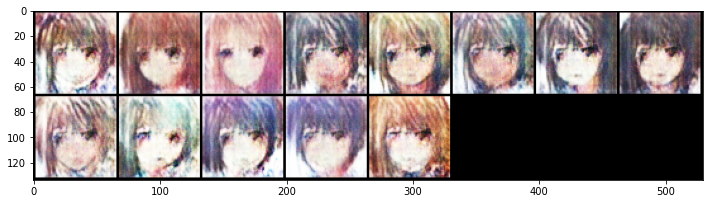

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


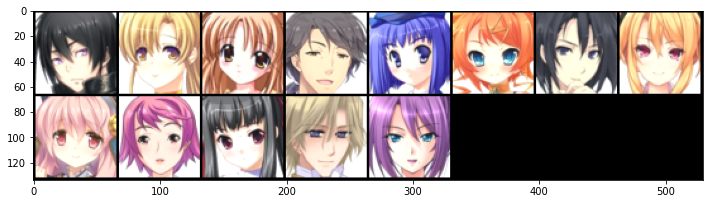

  0%|          | 0/994 [00:00<?, ?it/s]

In [ ]:
n_epochs = 100
cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
for epoch in range(n_epochs):

    for real, _ in tqdm(trainloader):
        cur_batch_size = len(real)
        real = real.to(device)

        disc_opt.zero_grad()
        fake_noise = torch.randn(cur_batch_size, latent_dim,1,1, device=device)
        fake = gen(fake_noise)
        disc_fake_pred = disc(fake)
        disc_fake_loss = F.binary_cross_entropy(disc_fake_pred, torch.zeros_like(disc_fake_pred))
        disc_real_pred = disc(real)
        disc_real_loss = F.binary_cross_entropy(disc_real_pred, torch.ones_like(disc_real_pred))
        disc_loss = (disc_fake_loss + disc_real_loss) / 2
        mean_discriminator_loss += disc_loss.item() / displaystep
        disc_loss.backward()
        disc_opt.step()
        gen_opt.zero_grad()
        fake_noise_2 = torch.randn(cur_batch_size, latent_dim,1,1,device=device)
        fake_2 = gen(fake_noise_2)
        disc_fake_pred = disc(fake_2)
        gen_loss = F.binary_cross_entropy(disc_fake_pred, torch.ones_like(disc_fake_pred))
        gen_loss.backward()
        gen_opt.step()
        mean_generator_loss += gen_loss.item() / displaystep
    
    print(f"epochs {epoch}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
    show_tensor_images(fake)
    show_tensor_images(real)
    mean_generator_loss = 0
    mean_discriminator_loss = 0


